In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split , cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

from sklearn.linear_model import LogisticRegression

# Load the Data

In [ ]:
df = pd.read_csv('/content/water_potability.csv')
df

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [ ]:
print(df.describe())

                ph     Hardness        Solids  Chloramines      Sulfate  \
count  2785.000000  3276.000000   3276.000000  3276.000000  2495.000000   
mean      7.080795   196.369496  22014.092526     7.122277   333.775777   
std       1.594320    32.879761   8768.570828     1.583085    41.416840   
min       0.000000    47.432000    320.942611     0.352000   129.000000   
25%       6.093092   176.850538  15666.690297     6.127421   307.699498   
50%       7.036752   196.967627  20927.833607     7.130299   333.073546   
75%       8.062066   216.667456  27332.762127     8.114887   359.950170   
max      14.000000   323.124000  61227.196008    13.127000   481.030642   

       Conductivity  Organic_carbon  Trihalomethanes    Turbidity   Potability  
count   3276.000000     3276.000000      3114.000000  3276.000000  3276.000000  
mean     426.205111       14.284970        66.396293     3.966786     0.390110  
std       80.824064        3.308162        16.175008     0.780382     0.487849  


In [ ]:
df.dtypes

ph                 float64
Hardness           float64
Solids             float64
Chloramines        float64
Sulfate            float64
Conductivity       float64
Organic_carbon     float64
Trihalomethanes    float64
Turbidity          float64
Potability           int64
dtype: object

## Count no of null values before removing outliers

In [ ]:
print(df.isnull().sum())

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64


In [ ]:
df.shape

(3276, 10)

In [ ]:
df.drop_duplicates()
df
#There are no duplicates

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1


# Removing outliers

In [ ]:
# Function to detect outliers using the IQR method
def detect_outliers_iqr(df):
    outlier_indices = set()  # Set to hold unique outlier indices
    outlier_data = {}  # Dictionary to hold outlier data for each column

    for column in df.columns:
        q1 = df[column].quantile(0.25)
        q3 = df[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        # Find outliers in the current column
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]

        # Add outlier indices to the set for unique counting
        outlier_indices.update(outliers.index)

        # Store the outlier data for the current column
        outlier_data[column] = outliers

    return outlier_data, outlier_indices

# Detect outliers and get the total count of unique outlier indices
outlier_data, unique_outlier_indices = detect_outliers_iqr(df)

# Print outliers for each column
print("Outliers detected using IQR:")
for column, outliers in outlier_data.items():
    print(f"Column {column} outliers:")
    print(outliers, "\n")



Outliers detected using IQR:
Column ph outliers:
             ph    Hardness        Solids  Chloramines     Sulfate  \
9     11.180284  227.231469  25484.508491     9.077200  404.041635   
80     1.844538  233.764343  28689.595778     7.724432         NaN   
104    2.612036  188.804126  34798.252587     6.796439         NaN   
128   11.180695  228.300860  16600.392747     6.094001         NaN   
204   11.267828  161.896362   6040.369868     7.205414         NaN   
263   13.175402   47.432000  19237.949676     8.907020  375.147315   
317   11.301794   77.459586  39227.619457     8.517986  337.501247   
354    2.798549  311.383956  26931.243483     7.116897         NaN   
692    1.757037  147.581831  41538.242730     7.728177  376.012933   
726    0.227499  152.530111  39028.599340     3.462492  283.693782   
783   11.898078  228.132673   8296.550611     9.899637  346.649750   
810    0.989912  133.216942  16922.853899     9.293289  444.375731   
1023  11.027880  228.322798  13124.105636

In [ ]:
# Calculate and print the total number of unique outliers across all columns
total_unique_outliers = len(unique_outlier_indices)
print("Total number of unique outliers across all columns:", total_unique_outliers)

Total number of unique outliers across all columns: 325


In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Filter out outliers
df_no_outliers = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]
df_no_outliers

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
...,...,...,...,...,...,...,...,...,...,...
3270,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1


### filling the null values with the mean after removing the outliers as the mean is affected by the presence of the outliers

In [ ]:
from sklearn.impute import SimpleImputer
# Create a SimpleImputer instance and set strategy to 'mean'
imputer = SimpleImputer(strategy='mean')

# Fit the imputer on the DataFrame and transform the data
df_no_outliers = pd.DataFrame(imputer.fit_transform(df_no_outliers), columns=df.columns)
df_no_outliers

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.073836,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0.0
1,3.716080,129.422921,18630.057858,6.635246,334.105192,592.885359,15.180013,56.329076,4.500656,0.0
2,8.099124,224.236259,19909.541732,9.275884,334.105192,418.606213,16.868637,66.420093,3.055934,0.0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0.0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0.0
...,...,...,...,...,...,...,...,...,...,...
2946,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,1.0
2947,7.808856,193.553212,17329.802160,8.061362,334.105192,392.449580,19.903225,66.419854,2.798243,1.0
2948,9.419510,175.762646,33155.578218,7.350233,334.105192,432.044783,11.039070,69.845400,3.298875,1.0
2949,5.126763,230.603758,11983.869376,6.303357,334.105192,402.883113,11.168946,77.488213,4.708658,1.0


In [ ]:
df_no_outliers

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.073836,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0.0
1,3.716080,129.422921,18630.057858,6.635246,334.105192,592.885359,15.180013,56.329076,4.500656,0.0
2,8.099124,224.236259,19909.541732,9.275884,334.105192,418.606213,16.868637,66.420093,3.055934,0.0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0.0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0.0
...,...,...,...,...,...,...,...,...,...,...
2946,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,1.0
2947,7.808856,193.553212,17329.802160,8.061362,334.105192,392.449580,19.903225,66.419854,2.798243,1.0
2948,9.419510,175.762646,33155.578218,7.350233,334.105192,432.044783,11.039070,69.845400,3.298875,1.0
2949,5.126763,230.603758,11983.869376,6.303357,334.105192,402.883113,11.168946,77.488213,4.708658,1.0


In [ ]:
print(df_no_outliers.isnull().sum())

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64


# Normalization

In [ ]:
column_means = df_no_outliers.mean()
column_means

ph                     7.073836
Hardness             196.509523
Solids             21597.987516
Chloramines            7.118711
Sulfate              334.105192
Conductivity         425.545964
Organic_carbon        14.317080
Trihalomethanes       66.419854
Turbidity              3.969211
Potability             0.381904
dtype: float64

In [ ]:
numerical_columns = df_no_outliers.select_dtypes(include=[np.number]).columns.tolist()
# Exclude the target variable ('potability')
numerical_columns.remove('Potability')

In [ ]:
scaler = MinMaxScaler(feature_range=(0, 1))

In [ ]:
df_no_outliers_normalized=df_no_outliers.copy()
df_no_outliers_normalized[numerical_columns] = scaler.fit_transform(df_no_outliers_normalized[numerical_columns])

In [ ]:
print(df_no_outliers_normalized.head())

         ph  Hardness    Solids  Chloramines   Sulfate  Conductivity  \
0  0.503301  0.550929  0.461758     0.521044  0.667755      0.804335   
1  0.072751  0.073574  0.413005     0.436928  0.502373      0.867709   
2  0.634769  0.673297  0.441867     0.770960  0.502373      0.481211   
3  0.662676  0.610911  0.489438     0.617070  0.611859      0.358484   
4  0.762110  0.400456  0.398319     0.425714  0.387175      0.436423   

   Organic_carbon  Trihalomethanes  Turbidity  Potability  
0        0.280742         0.743011   0.258967         0.0  
1        0.549332         0.382523   0.624070         0.0  
2        0.643817         0.501162   0.281003         0.0  
3        0.731546         0.899974   0.654492         0.0  
4        0.346683         0.096466   0.523011         0.0  


# Data Visualization

## Histogram

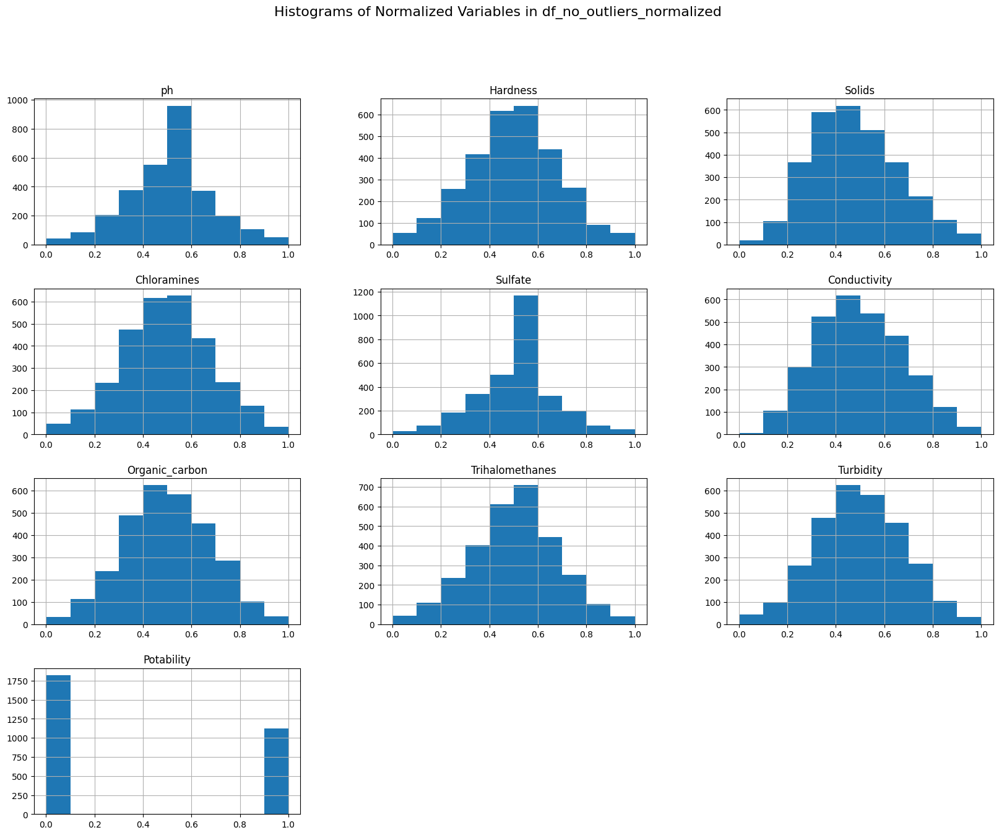

In [ ]:
df_no_outliers_normalized.hist(figsize=(20,15))
plt.suptitle('Histograms of Normalized Variables in df_no_outliers_normalized', fontsize=16)
plt.show()

## Box Plot

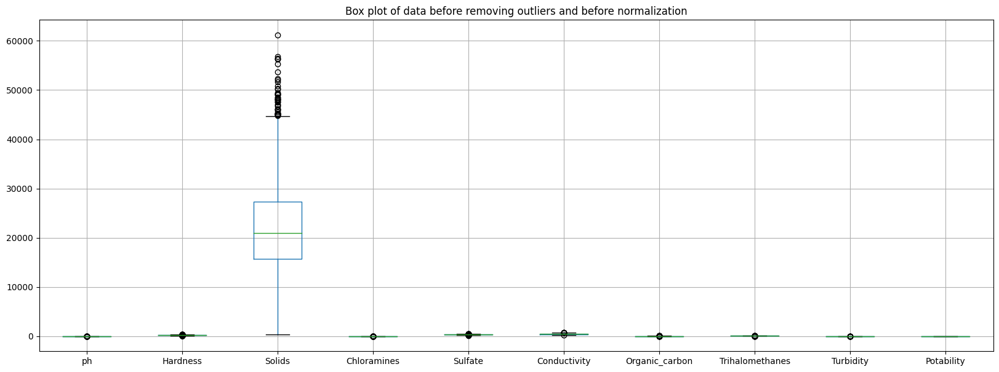

In [ ]:
df.boxplot(figsize=(20,7))
plt.title('Box plot of data before removing outliers and before normalization')
plt.show()

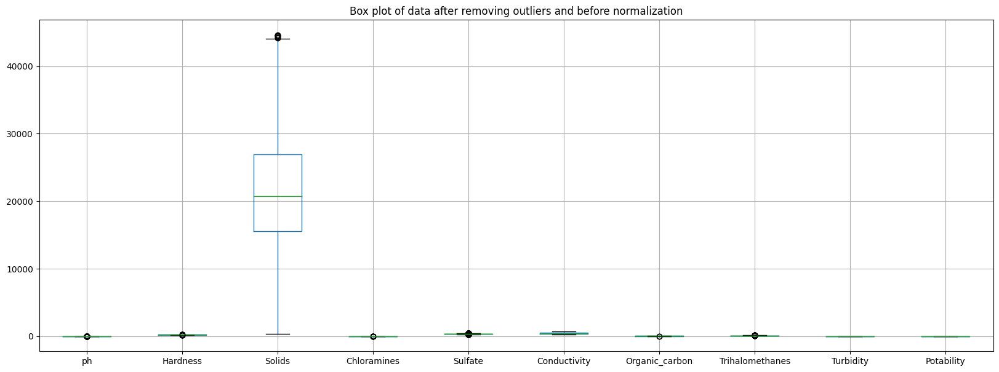

In [ ]:
df_no_outliers.boxplot(figsize=(20,7))
plt.title('Box plot of data after removing outliers and before normalization')
plt.show()

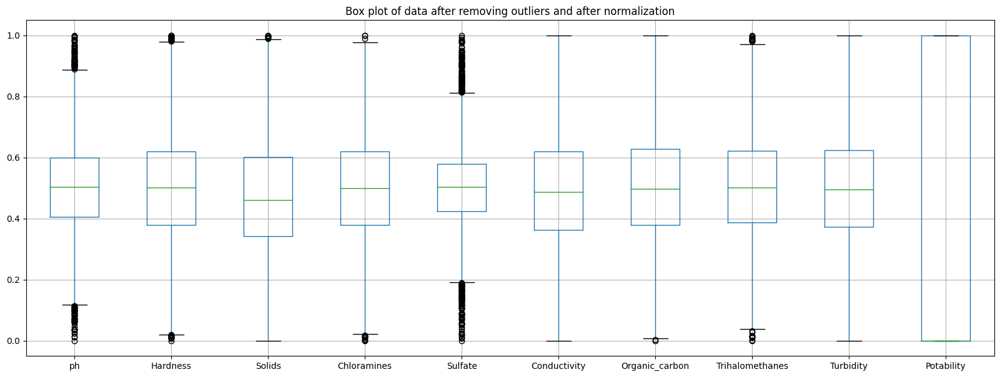

In [ ]:
df_no_outliers_normalized.boxplot(figsize=(20,7))
plt.title('Box plot of data after removing outliers and after normalization')
plt.show()

In [ ]:
# Q1 = df_no_outliers_normalized.quantile(0.25)
# Q3 = df_no_outliers_normalized.quantile(0.75)
# IQR = Q3 - Q1

# # Filter out outliers
# df_no_outliers_normalizedd = df_no_outliers_normalized[~((df_no_outliers_normalized < (Q1 - 1.5 * IQR)) | (df_no_outliers_normalized > (Q3 + 1.5 * IQR))).any(axis=1)]

# df_no_outliers_normalizedd.boxplot(figsize=(20,7))
# plt.title('Box plot of data after removing outliers and after normalization')
# plt.show()

## Bar Plot

### Checking the balance of the data

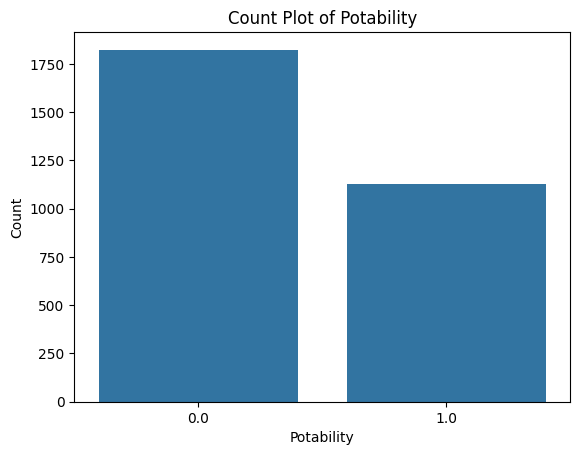

In [ ]:
sns.countplot(x='Potability', data=df_no_outliers_normalized)

plt.xlabel('Potability')
plt.ylabel('Count')
plt.title('Count Plot of Potability')


plt.show()

In [ ]:
potability_counts = df_no_outliers['Potability'].value_counts()


print("Number of entries with potability 0 (not drinkable):", potability_counts.get(0, 0))
print("Number of entries with potability 1 (drinkable):", potability_counts.get(1, 0))

Number of entries with potability 0 (not drinkable): 1824
Number of entries with potability 1 (drinkable): 1127


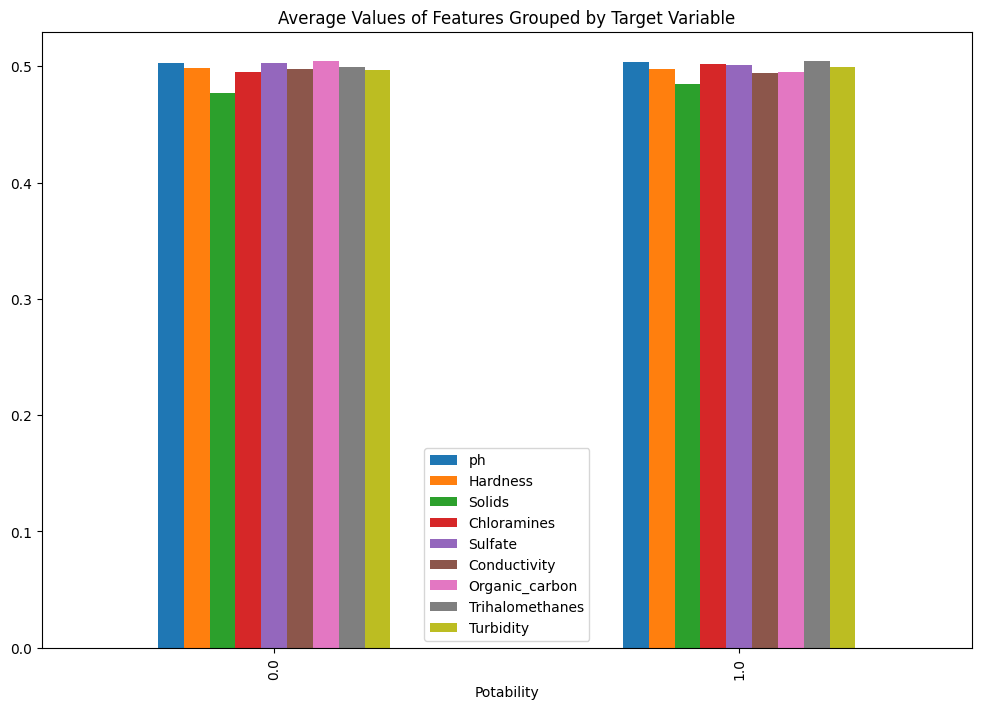

In [ ]:
df_grouped = df_no_outliers_normalized.groupby('Potability').mean()
df_grouped.plot(kind='bar', figsize=(12, 8))
plt.title('Average Values of Features Grouped by Target Variable')
plt.show()

## Correlation heatmap

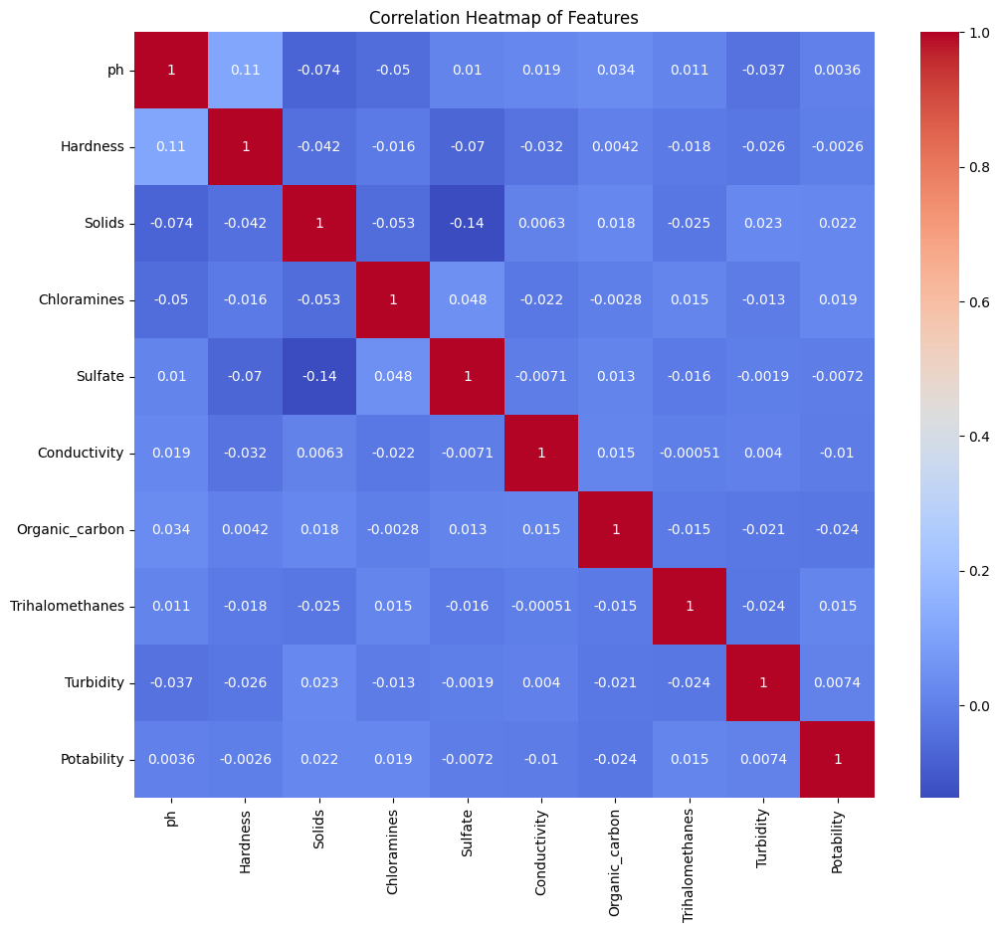

In [ ]:
correlation_matrix = df_no_outliers_normalized.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

plt.title('Correlation Heatmap of Features')
plt.show()

## Pair Plot

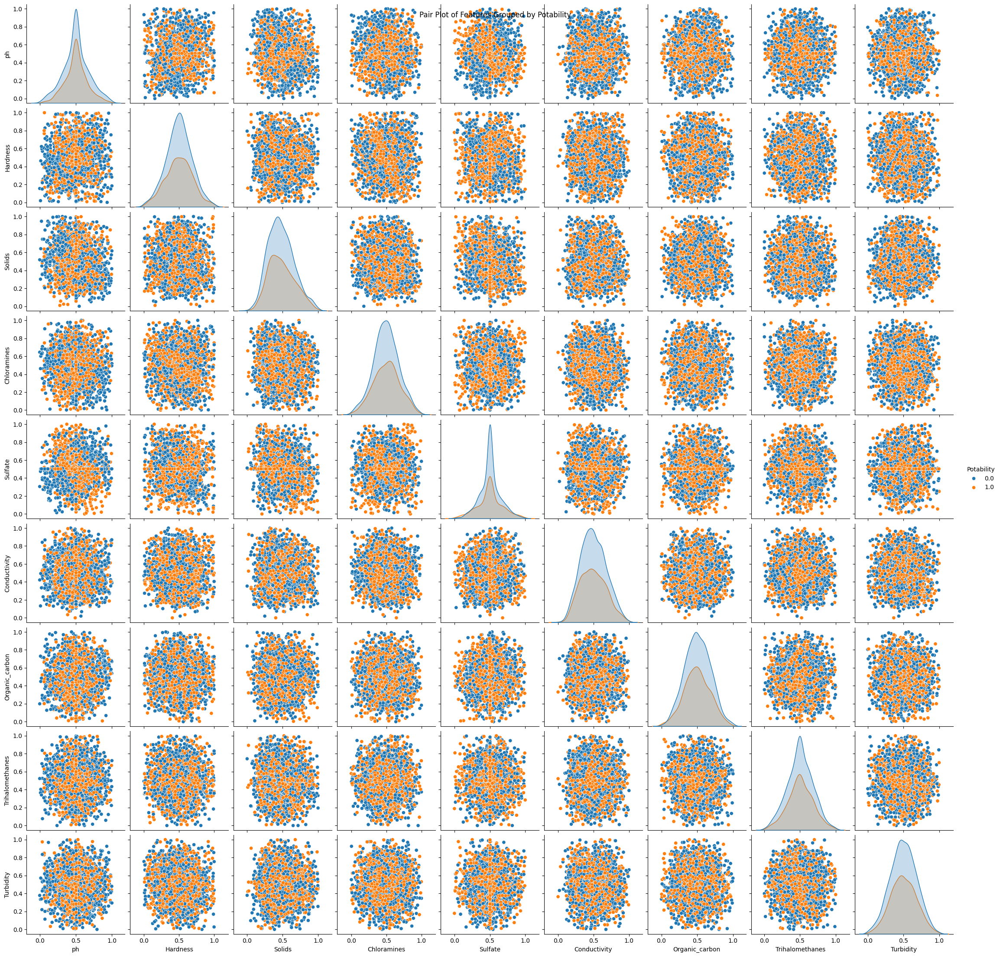

In [ ]:

sns.pairplot(df_no_outliers_normalized, hue='Potability')
plt.suptitle('Pair Plot of Features Grouped by Potability')
plt.show()

## Scatter plot

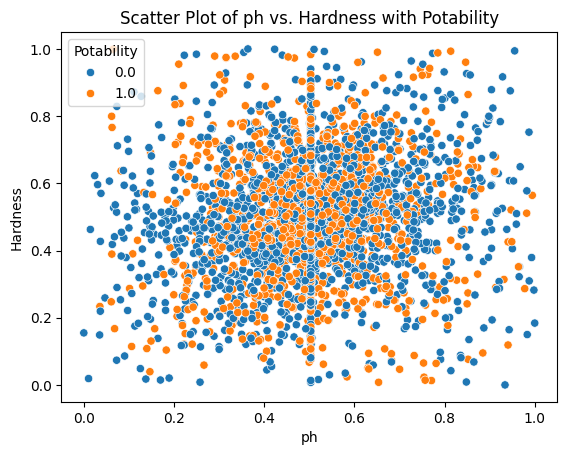

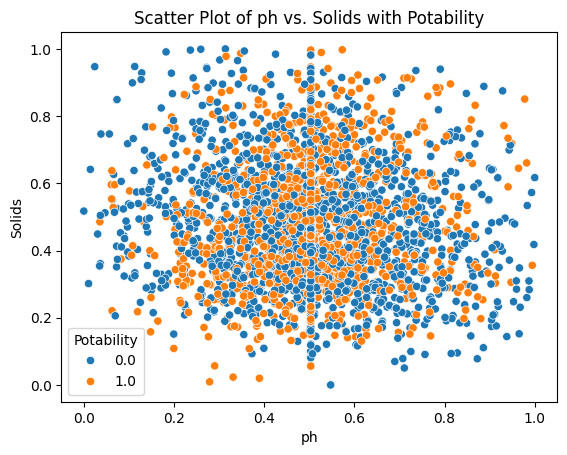

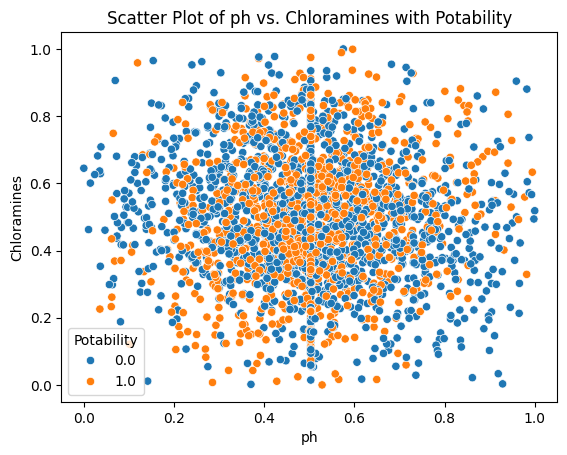

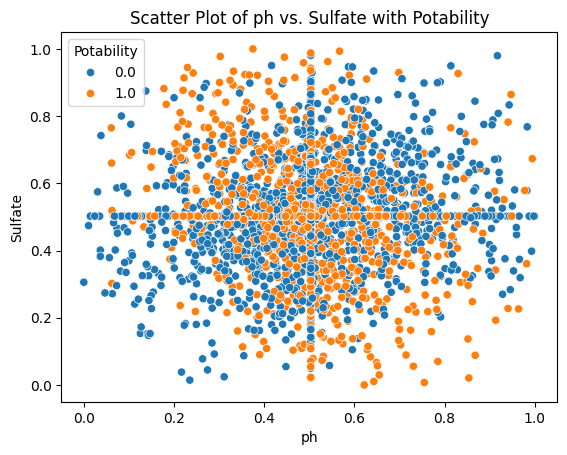

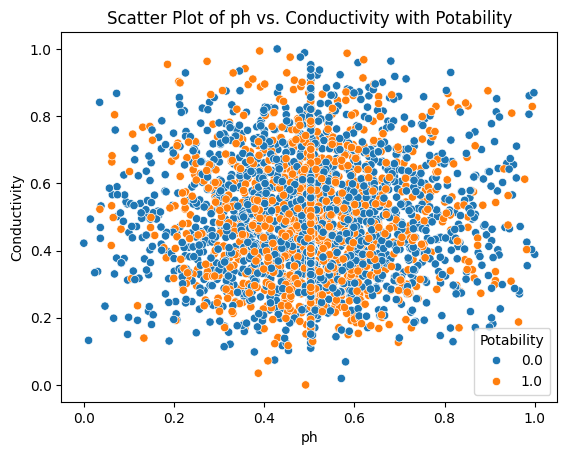

...

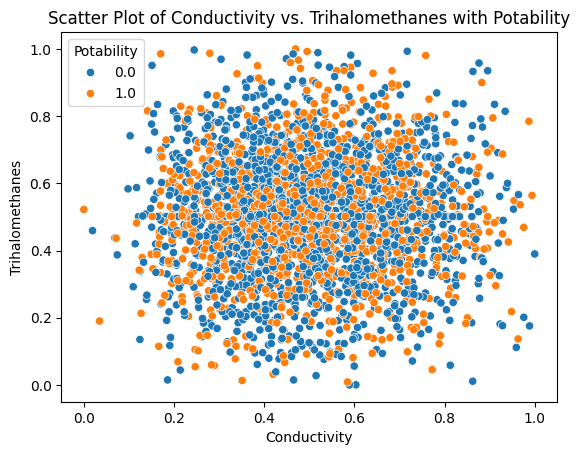

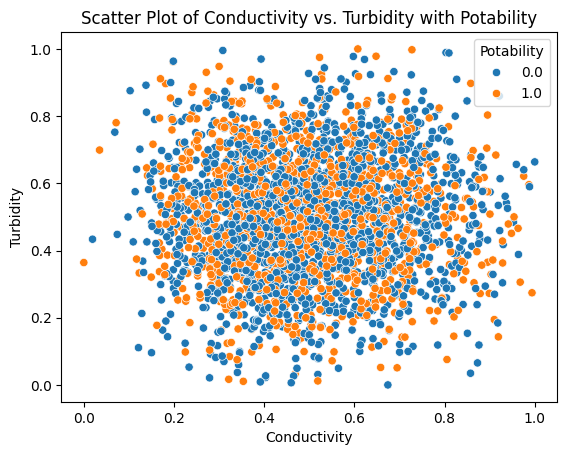

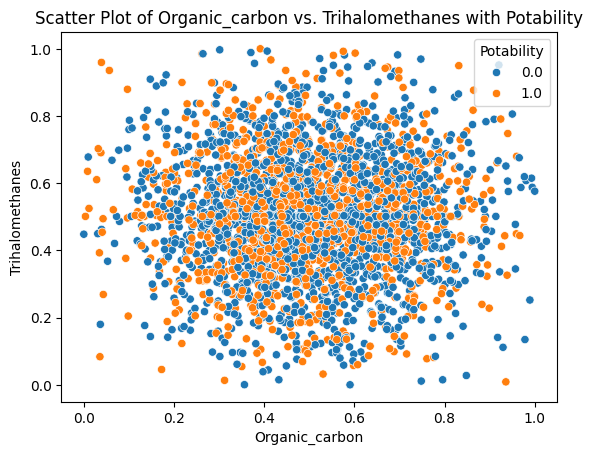

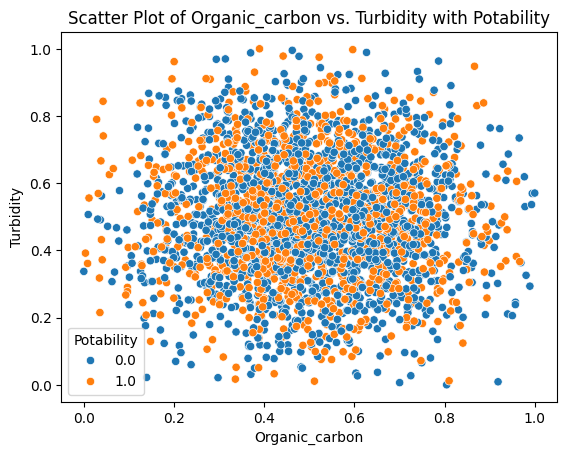

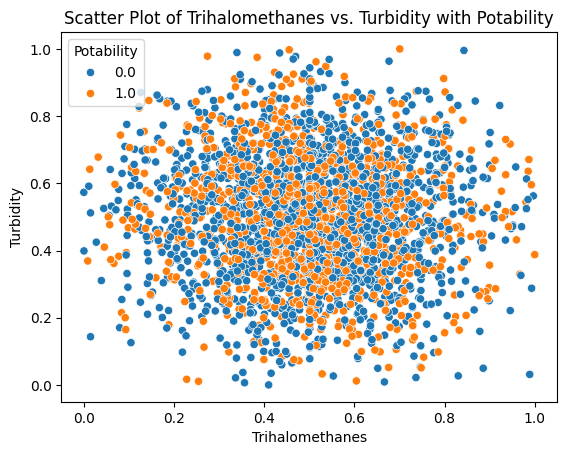

In [ ]:
features_to_plot = [column for column in df_no_outliers_normalized.columns if column != 'Potability']


for i in range(len(features_to_plot)):
    for j in range(i + 1, len(features_to_plot)):
        feature1 = features_to_plot[i]
        feature2 = features_to_plot[j]


        sns.scatterplot(x=feature1, y=feature2, hue='Potability', data=df_no_outliers_normalized)
        plt.title(f'Scatter Plot of {feature1} vs. {feature2} with Potability')
        plt.show()

## Violin plot

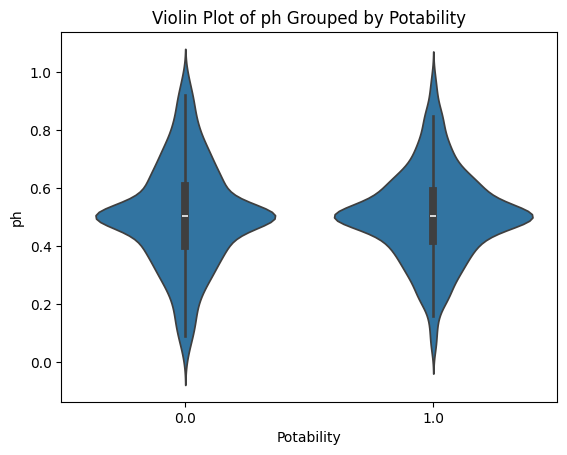

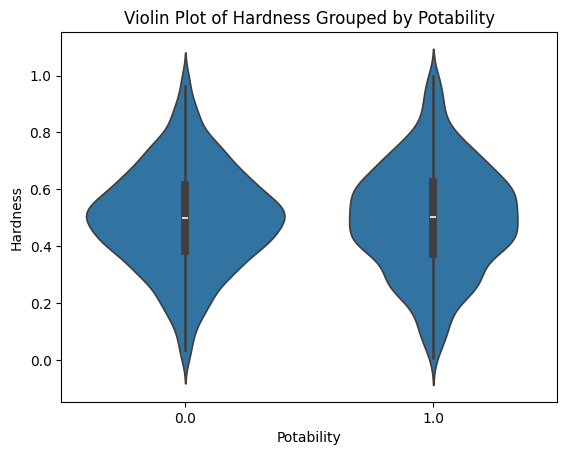

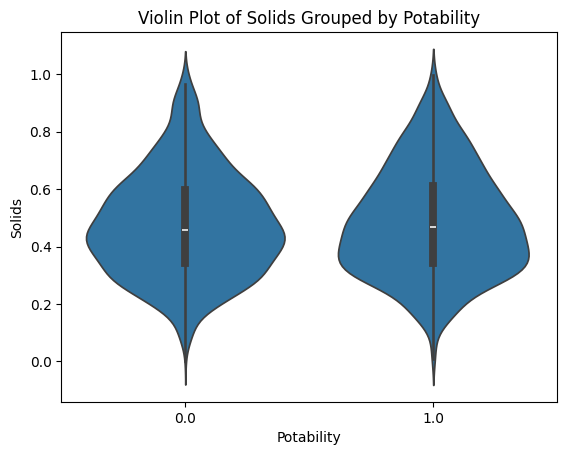

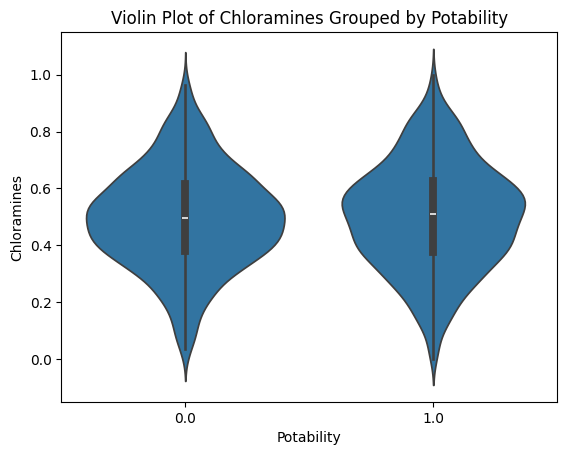

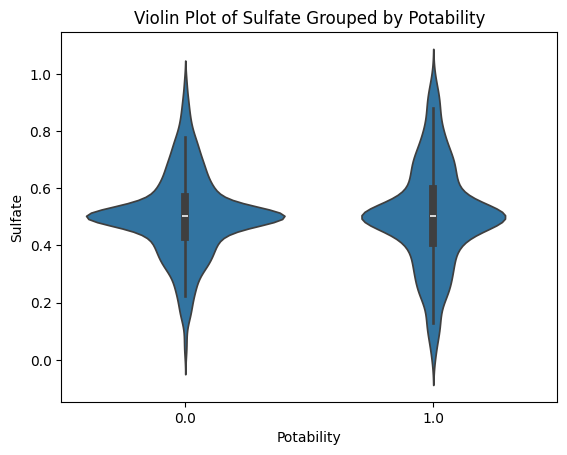

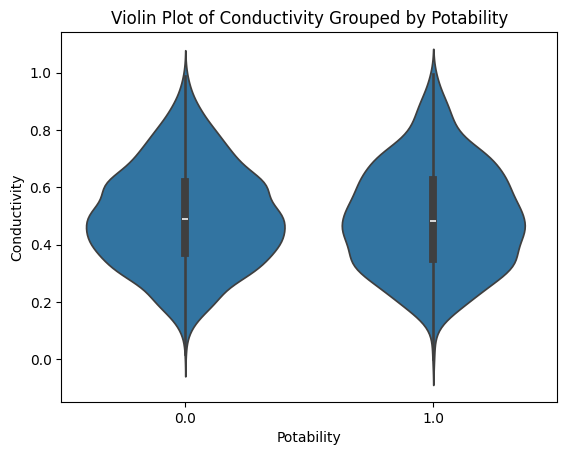

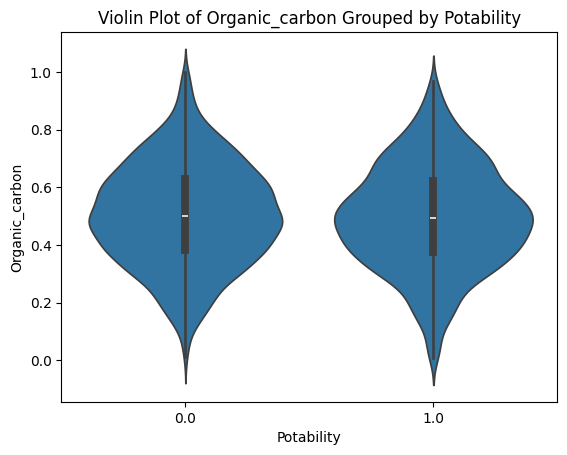

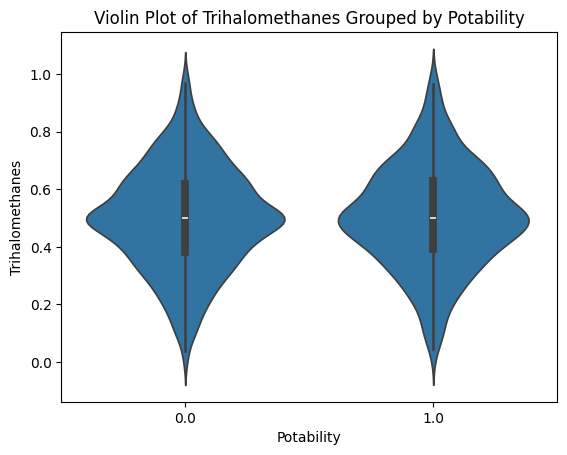

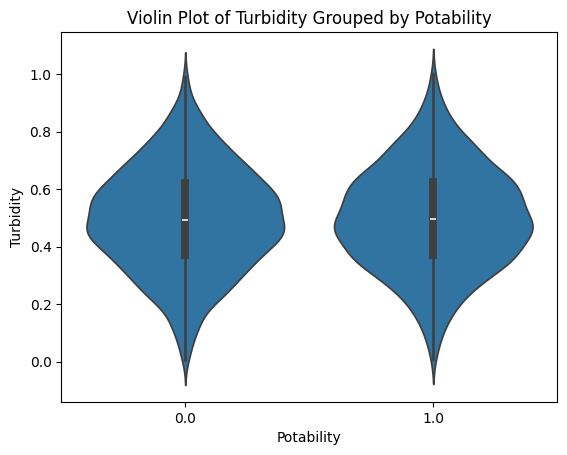

In [ ]:
features_to_plot = [column for column in df_no_outliers_normalized.columns if column != 'Potability']


for feature in features_to_plot:
    sns.violinplot(x='Potability', y=feature, data=df_no_outliers_normalized)
    plt.title(f'Violin Plot of {feature} Grouped by Potability')
    plt.show()

## Density Plot

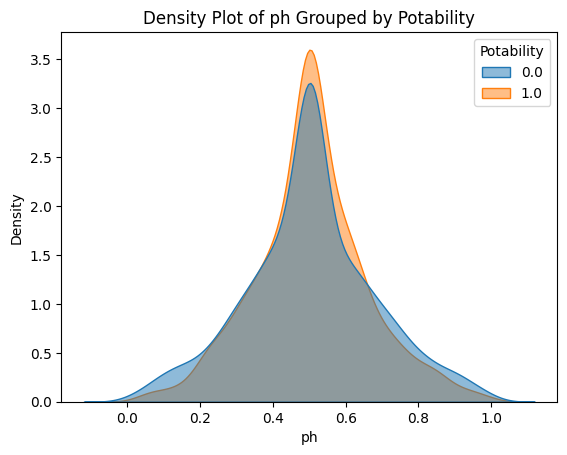

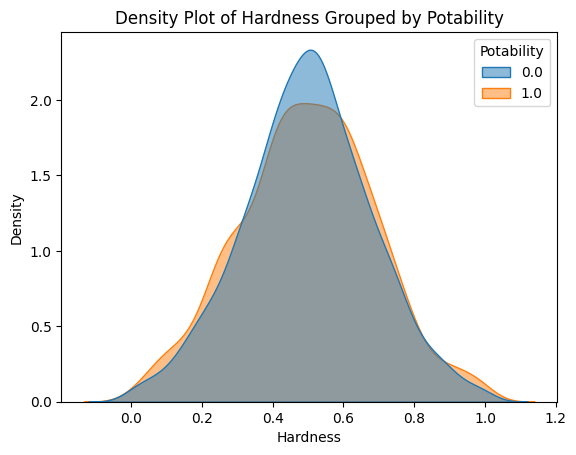

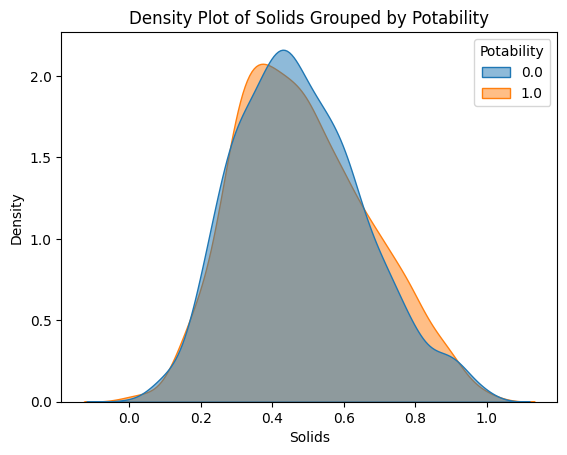

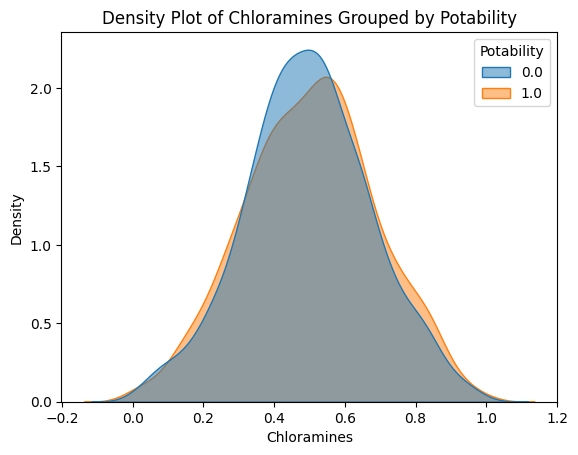

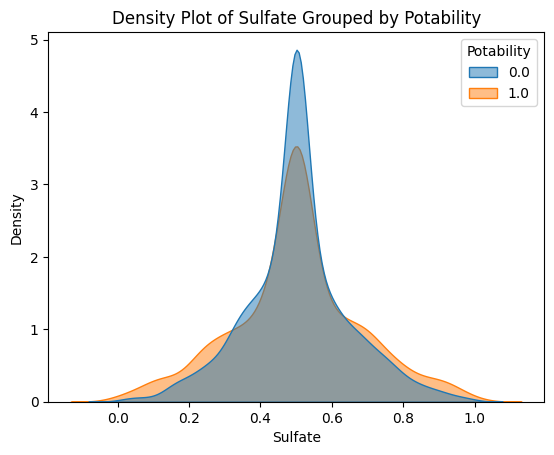

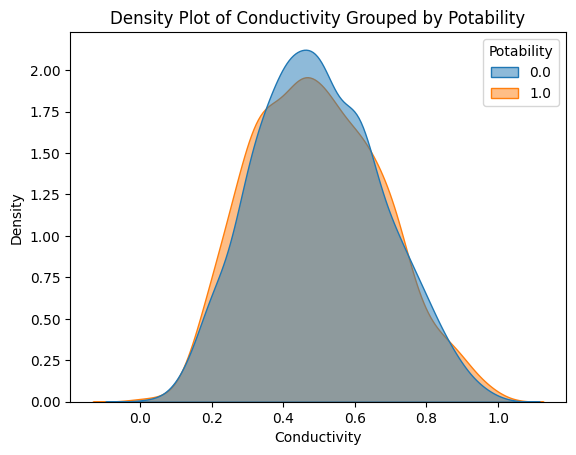

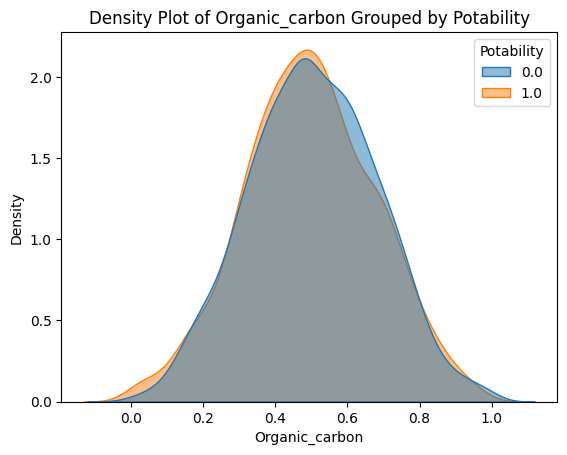

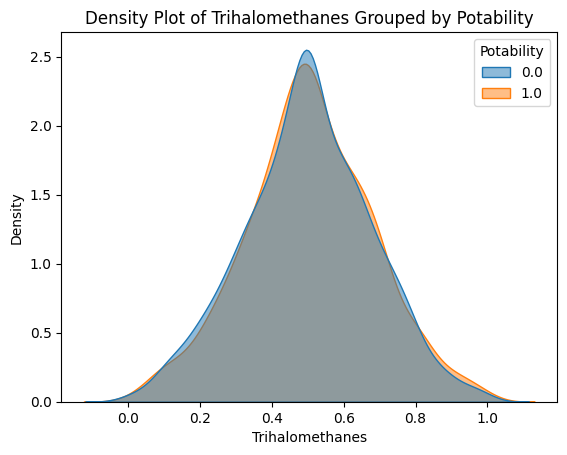

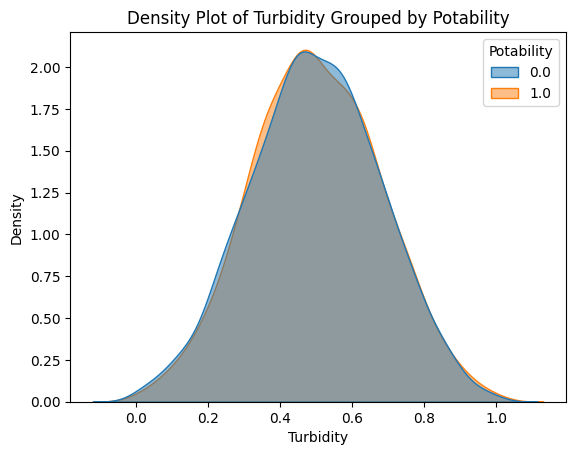

In [ ]:
features_to_plot = [column for column in df_no_outliers_normalized.columns if column != 'Potability']


for feature in features_to_plot:

    sns.kdeplot(data=df_no_outliers_normalized, x=feature, hue='Potability', common_norm=False, fill=True, alpha=0.5)


    plt.title(f'Density Plot of {feature} Grouped by Potability')


    plt.show()

# ML Models

In [ ]:
#!pip install xgboost

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

In [ ]:
df=df_no_outliers_normalized

In [ ]:
X = df.iloc[:, 0:9]
y = df.iloc[:, 9]
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
features= X.columns
X[features] = sc.fit_transform(X[features])

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2)

In [ ]:
#Hyperparameter tuning
lr = LogisticRegression(random_state=42)

knn = KNeighborsClassifier()

dt = DecisionTreeClassifier()

rf = RandomForestClassifier()

ada = AdaBoostClassifier(algorithm="SAMME")

xgb =XGBClassifier(eval_metric = 'logloss', use_label_encoder=False)


para_knn = {'n_neighbors':np.arange(1, 50)}  #parameters of knn
grid_knn = GridSearchCV(knn, param_grid=para_knn, cv=5)

#parameters for decision tree
para_dt = {'criterion':['gini','entropy'],'max_depth':np.arange(1, 50), 'min_samples_leaf':[1,2,4,5,10,20,30,40,80,100]}
grid_dt = GridSearchCV(dt, param_grid=para_dt, cv=5) #grid search decision tree for 5 fold cv
#"gini" for the Gini impurity and “entropy” for the information gain.
#min_samples_leaf: The minimum number of samples required to be at a leaf node, have the effect of smoothing the model

#parameters for random forest
#n_estimators: The number of trees in the forest.
params_rf = {'n_estimators':[100,200, 350, 500], 'min_samples_leaf':[2, 10, 30]}
grid_rf = GridSearchCV(rf, param_grid=params_rf, cv=5)

#parameters fpr AdaBoost
params_ada = {'n_estimators': [50,100,250,400,500,600], 'learning_rate': [0.2,0.5,0.8,1]}
grid_ada =  GridSearchCV(ada, param_grid=params_ada, cv=5)

#XGBoost
#parameters for xgboost
params_xgb = {'n_estimators': [50,100,250,400,600,800,1000], 'learning_rate': [0.2,0.5,0.8,1]}
rs_xgb =  RandomizedSearchCV(xgb, param_distributions=params_xgb, cv=5)


In [ ]:
grid_knn.fit(X_train, y_train)
grid_dt.fit(X_train, y_train)
grid_rf.fit(X_train, y_train)
grid_ada.fit(X_train, y_train)
rs_xgb.fit(X_train, y_train)

print("Best parameters for KNN:", grid_knn.best_params_)
print("Best parameters for Decision Tree:", grid_dt.best_params_)
print("Best parameters for Random Forest:", grid_rf.best_params_)
print("Best parameters for AdaBoost:", grid_ada.best_params_)
print("Best parameters for XGBoost:", rs_xgb.best_params_)

Best parameters for KNN: {'n_neighbors': 37}
Best parameters for Decision Tree: {'criterion': 'entropy', 'max_depth': 6, 'min_samples_leaf': 20}
Best parameters for Random Forest: {'min_samples_leaf': 2, 'n_estimators': 500}
Best parameters for AdaBoost: {'learning_rate': 0.2, 'n_estimators': 500}
Best parameters for XGBoost: {'n_estimators': 50, 'learning_rate': 0.2}


In [ ]:
lr = LogisticRegression(random_state=42)
dt = DecisionTreeClassifier(criterion='gini', max_depth=8, min_samples_leaf=80, random_state=42)
knn = KNeighborsClassifier(n_neighbors=31)
rf = RandomForestClassifier(n_estimators=350, min_samples_leaf=2, random_state=42)
ada = AdaBoostClassifier(n_estimators= 50, learning_rate= 0.2 )
xgb = XGBClassifier(n_estimators= 50, learning_rate= 0.2)

#apply bagging and boosting
bagging = BaggingClassifier(
                           n_estimators = 80)
bagging.fit(X_train, y_train)


BaggingClassifier(n_estimators=80, random_state=42)

In [ ]:
classifiers = [('Logistic Regression', lr), ('K Nearest Neighbours', knn),
               ('Decision Tree', dt), ('Random Forest', rf), ('AdaBoost', ada),
              ('Bagging Classifier', bagging), ('XGBoost', xgb)]


In [ ]:
from sklearn.metrics import accuracy_score

for classifier_name, classifier in classifiers:

    # Fit clf to the training set
    classifier.fit(X_train, y_train)

    # Predict y_pred
    y_pred = classifier.predict(X_test)
    accuracy = accuracy_score(y_test,y_pred)



    # Evaluate clf's accuracy on the test set
    print('{:s} : {:.2f}'.format(classifier_name, accuracy))

Logistic Regression : 0.62
K Nearest Neighbours : 0.65
Decision Tree : 0.61
Random Forest : 0.67
AdaBoost : 0.62
Bagging Classifier : 0.66
XGBoost : 0.65


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

for classifier_name, classifier in classifiers:
    # Fit clf to the training set
    classifier.fit(X_train, y_train)

    # Predict y_pred
    y_pred = classifier.predict(X_test)
    accuracy = accuracy_score(y_test,y_pred)

    # Print classification report
    print('\nClassification Report of', classifier_name)
    print(classification_report(y_test, y_pred))

    # Print confusion matrix
    print('\nConfusion Matrix of', classifier_name)
    print(confusion_matrix(y_test, y_pred))

    print('{:s} : {:.2f}'.format(classifier_name, accuracy))



Classification Report of Logistic Regression
              precision    recall  f1-score   support

         0.0       0.63      1.00      0.77       373
         1.0       0.00      0.00      0.00       218

    accuracy                           0.63       591
   macro avg       0.32      0.50      0.39       591
weighted avg       0.40      0.63      0.49       591


Confusion Matrix of Logistic Regression
[[373   0]
 [218   0]]
Logistic Regression : 0.63

Classification Report of K Nearest Neighbours
              precision    recall  f1-score   support

         0.0       0.70      0.69      0.69       373
         1.0       0.48      0.49      0.48       218

    accuracy                           0.61       591
   macro avg       0.59      0.59      0.59       591
weighted avg       0.62      0.61      0.61       591


Confusion Matrix of K Nearest Neighbours
[[257 116]
 [112 106]]
K Nearest Neighbours : 0.61

Classification Report of Decision Tree
              precision    re

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Classification Report of Random Forest
              precision    recall  f1-score   support

         0.0       0.69      0.85      0.76       373
         1.0       0.57      0.33      0.42       218

    accuracy                           0.66       591
   macro avg       0.63      0.59      0.59       591
weighted avg       0.64      0.66      0.64       591


Confusion Matrix of Random Forest
[[318  55]
 [145  73]]
Random Forest : 0.66

Classification Report of AdaBoost
              precision    recall  f1-score   support

         0.0       0.64      0.96      0.77       373
         1.0       0.52      0.08      0.14       218

    accuracy                           0.63       591
   macro avg       0.58      0.52      0.45       591
weighted avg       0.59      0.63      0.53       591


Confusion Matrix of AdaBoost
[[357  16]
 [201  17]]
AdaBoost : 0.63

Classification Report of Bagging Classifier
              precision    recall  f1-score   support

         0.0       0.69

In [ ]:
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import classification_report
# from sklearn.metrics import accuracy_score

# # Instantiate the model
# model = LogisticRegression()

# # Fit the model
# model.fit(x_train, y_train)

# # Predict on the test set
# y_pred = model.predict(x_test)

# # Print the classification report
# print("Accuracy of the model:", accuracy_score(y_test, y_pred))
# print(classification_report(y_test, y_pred))


NameError: name 'X_train' is not defined

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=350, min_samples_leaf=2, random_state=42)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

print("Accuracy of the model:", accuracy_score(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy of the model: 0.6615905245346869
Confusion Matrix:
 [[318  55]
 [145  73]]
Classification Report:
               precision    recall  f1-score   support

         0.0       0.69      0.85      0.76       373
         1.0       0.57      0.33      0.42       218

    accuracy                           0.66       591
   macro avg       0.63      0.59      0.59       591
weighted avg       0.64      0.66      0.64       591



In [ ]:
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.metrics import confusion_matrix, f1_score, precision_score, accuracy_score
# dt_model = DecisionTreeClassifier(criterion='entropy', random_state=42)
# dt_model.fit(x_train, y_train)

# y_pred_dt = dt_model.predict(x_test)

# print("Accuracy of the Decision Tree model:", accuracy_score(y_test, y_pred_dt))
# print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_dt))
# print("Classification Report:\n", classification_report(y_test, y_pred_dt))


In [ ]:
x_rf=rf.predict([[7.808856,	193.553212,	17329.802160,	8.061362,	333.775777,	392.449580,	19.903225,	66.396293,	2.798243	]])
x_rf

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array([1.])

In [ ]:
from sklearn.ensemble import BaggingClassifier

bag_clf = BaggingClassifier(n_estimators=80)

bag_clf.fit(X_train, y_train)
y_pred = bag_clf.predict(X_test)

print("Accuracy of the Bagging classifier:", accuracy_score(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))



Accuracy of the Bagging classifier: 0.6818950930626058
Confusion Matrix:
 [[312  61]
 [127  91]]
Classification Report:
               precision    recall  f1-score   support

         0.0       0.71      0.84      0.77       373
         1.0       0.60      0.42      0.49       218

    accuracy                           0.68       591
   macro avg       0.65      0.63      0.63       591
weighted avg       0.67      0.68      0.67       591



Logistic Regression AUC: 0.45597314115650445
K Nearest Neighbors AUC: 0.587623287502767
Decision Tree AUC: 0.5880721646948865
Random Forest AUC: 0.6510072066310845
AdaBoost AUC: 0.5536070049437981
Bagging Classifier AUC: 0.6457375113756549
XGBoost AUC: 0.6196226971985144


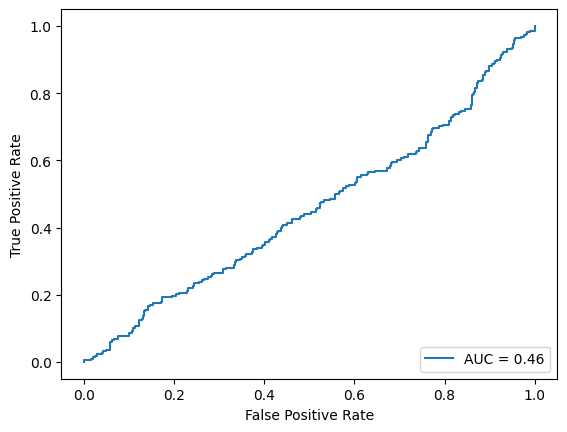

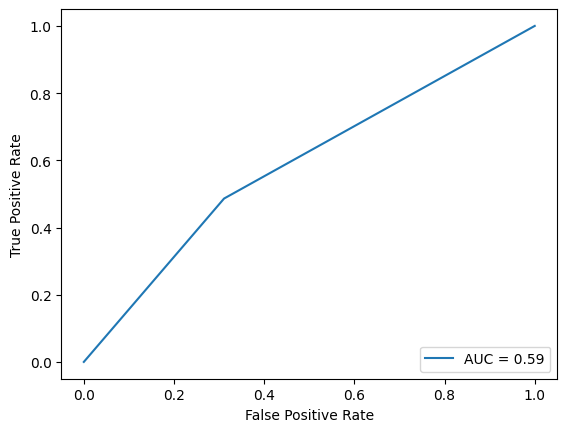

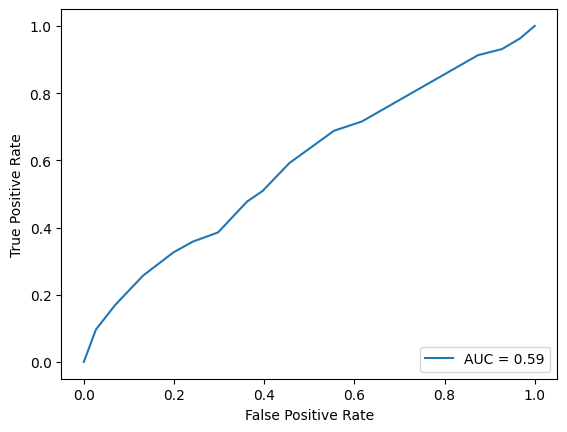

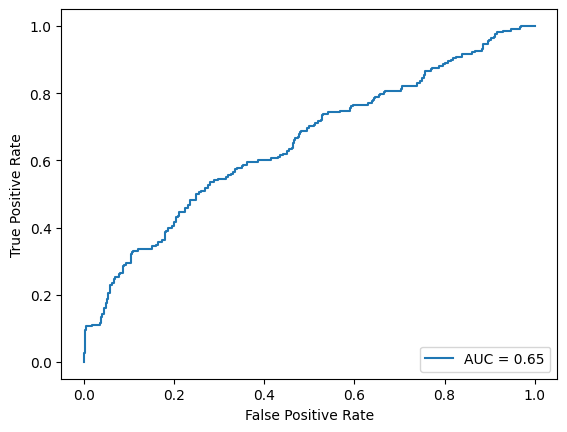

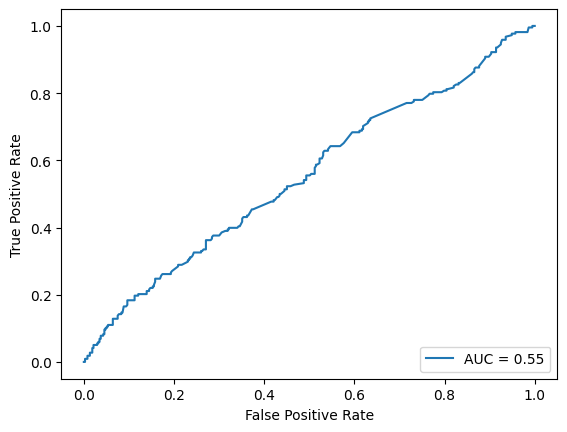

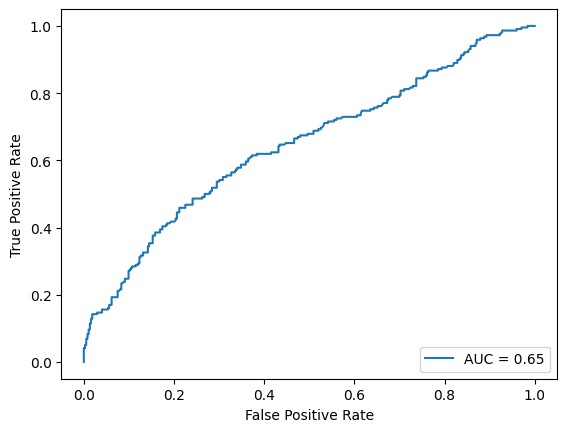

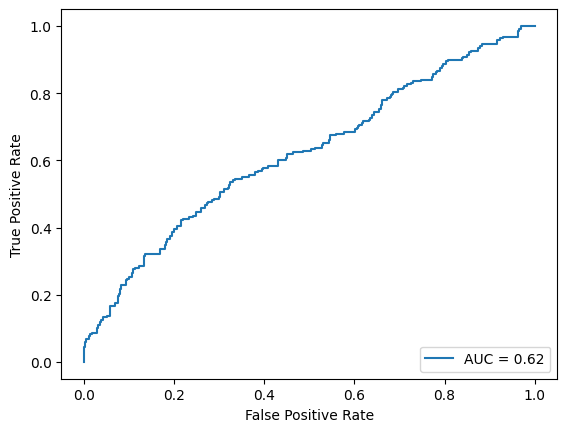

In [ ]:
from sklearn.metrics import roc_curve, auc, RocCurveDisplay

# Define a function to plot ROC curves for multiple models
def plot_roc_curves(models, X_test, y_test):
    for name, model in models:
        # Predict probabilities on the test set
        y_proba = model.predict_proba(X_test)[:, 1]

        # Calculate ROC curve and AUC
        fpr, tpr, _ = roc_curve(y_test, y_proba)
        roc_auc = auc(fpr, tpr)

        # Plot the ROC curve
        RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc).plot()

# Create a list of models
models = [
    ('Logistic Regression', lr),
    ('K Nearest Neighbors', knn),
    ('Decision Tree', dt),
    ('Random Forest', rf),
    ('AdaBoost', ada),
    ('Bagging Classifier', bagging),
    ('XGBoost', xgb)
]

# Plot the ROC curves
plot_roc_curves(models, X_test, y_test)

# Print AUC values
for name, model in models:
    y_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc = auc(fpr, tpr)
    print(f"{name} AUC: {roc_auc}")


# Conclusion and summary on the data

1-The TDS levels seem to contain some descripency since its values are on an average 40 folds more than the upper limit for safe drinking water.

2-The data contains almost equal number of acidic and basic pH level water samples.

3-92% of the data was considered Hard.

4-Only 2% of the water samples were safe in terms of Chloramines levels.

5-Only 1.8% of the water samples were safe in terms of Sulfate levels.

6-90.6% of the water samples had higher Carbon levels than the typical Carbon levels in drinking water (10 ppm).

7-76.6% of water samples were safe for drinking in terms of Trihalomethane levels in water.

8-90.4% of the water samples were safe for drinking in terms of the Turbidity of water samples.

9-The correlation coefficients between the features were very low.

10-Random Forest and Bagging algorithm worked the best to train the model.

